Импорт библиотек
---

In [348]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns; sns.set()

Задание 1. Визуализация данных
---

Чтение датасета

In [349]:
df = pd.read_csv(r'D:\Study\IT-ml&ai-python\URSU\cars_moldova_no_dup.csv', delimiter = ',')
df

,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Transmission,Price(euro)
0,Toyota,Prius,2011,Hatchback,195000.0,1800.0,Hybrid,Automatic,7750.0
1,Renault,Grand Scenic,2014,Universal,135000.0,1500.0,Diesel,Manual,8550.0
2,Volkswagen,Golf,1998,Hatchback,1.0,1400.0,Petrol,Manual,2200.0
3,Renault,Laguna,2012,Universal,110000.0,1500.0,Diesel,Manual,6550.0
4,Opel,Astra,2006,Universal,200000.0,1600.0,Metan/Propan,Manual,4100.0
...,...,...,...,...,...,...,...,...,...
37259,Land Rover,Freelander,2002,Crossover,225000.0,1800.0,Metan/Propan,Manual,4400.0
37260,Dacia,Logan Mcv,2015,Universal,89000.0,1500.0,Diesel,Manual,7000.0
37261,Renault,Modus,2009,Hatchback,225.0,1500.0,Diesel,Manual,4500.0
37262,Mazda,6,2006,Combi,370000.0,2000.0,Diesel,Manual,4000.0


Обработка данных в датасете

In [350]:
# Разделяю наименования категориальных и числовых столбцов
cat_columns = []
num_columns = []

for column_name in df.columns:
    if (df[column_name].dtypes == object):
        cat_columns +=[column_name]
    else:
        num_columns +=[column_name]

print('Числовые столбцы: ', num_columns)
print('Категориальные столбцы: ', cat_columns)

# подчищу данные, которые мне не интересны и могут быть аномальными
# автомобиль из салона за 100500 денег не надо, спасибо
question_dist = df[df.Distance == 0]
df = df.drop(question_dist.index)
# автомобиль который стоял в гараже около двух лет мне не интересен
question_dist = df[(df.Year <2020) & (df.Distance < 1100)]
df = df.drop(question_dist.index)
# автомобили с таким пробегом, что придется скоро отдавать на СТО мне тоже не нужны
question_dist = df[(df.Distance > 250000)]
df = df.drop(question_dist.index)

question_engine = df[df["Engine_capacity(cm3)"] < 200]
df = df.drop(question_engine.index)

question_engine = df[df["Engine_capacity(cm3)"] > 5000]
df = df.drop(question_engine.index)
# цены-обманки как на авито мне не нужны
question_price = df[(df["Price(euro)"] < 101)]
df = df.drop(question_price.index)
# цены владельцев из дурки мне тоже не интересны
question_price = df[df["Price(euro)"] > 1e5]
df = df.drop(question_price.index)
# я не коллекционирую раритет
question_year = df[df.Year < 1971]
df = df.drop(question_year.index)

df = df.reset_index(drop=True)
df.head()




Числовые столбцы:  ['Year', 'Distance', 'Engine_capacity(cm3)', 'Price(euro)']
Категориальные столбцы:  ['Make', 'Model', 'Style', 'Fuel_type', 'Transmission']


,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Transmission,Price(euro)
0,Toyota,Prius,2011,Hatchback,195000.0,1800.0,Hybrid,Automatic,7750.0
1,Renault,Grand Scenic,2014,Universal,135000.0,1500.0,Diesel,Manual,8550.0
2,Renault,Laguna,2012,Universal,110000.0,1500.0,Diesel,Manual,6550.0
3,Opel,Astra,2006,Universal,200000.0,1600.0,Metan/Propan,Manual,4100.0
4,Volkswagen,Touareg,2010,SUV,220000.0,2400.0,Diesel,Automatic,17000.0


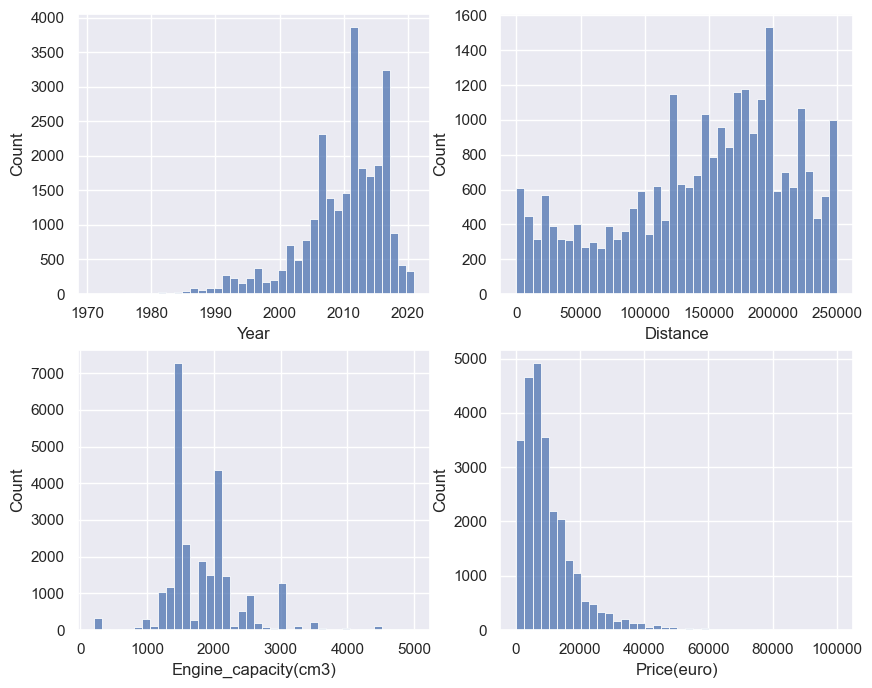

In [351]:
# определяю размеры вывода гистограмм числовых столбцов
width = 2
height = int(np.ceil(2))

# Вывожу пустые поля 2х2 для гистограмм размерами 10х8
fig, ax = plt.subplots(nrows=height, ncols=width, figsize=(10,8))

# Строим гистограммы
for idx, column_name in enumerate(num_columns):
    # Выбираю плот
    plt.subplot(height, width, idx+1)
    # Наношу гистограмму по данным и легенде
    sns.histplot(data=df, x=column_name, bins = 40)

<Figure size 1500x1500 with 0 Axes>

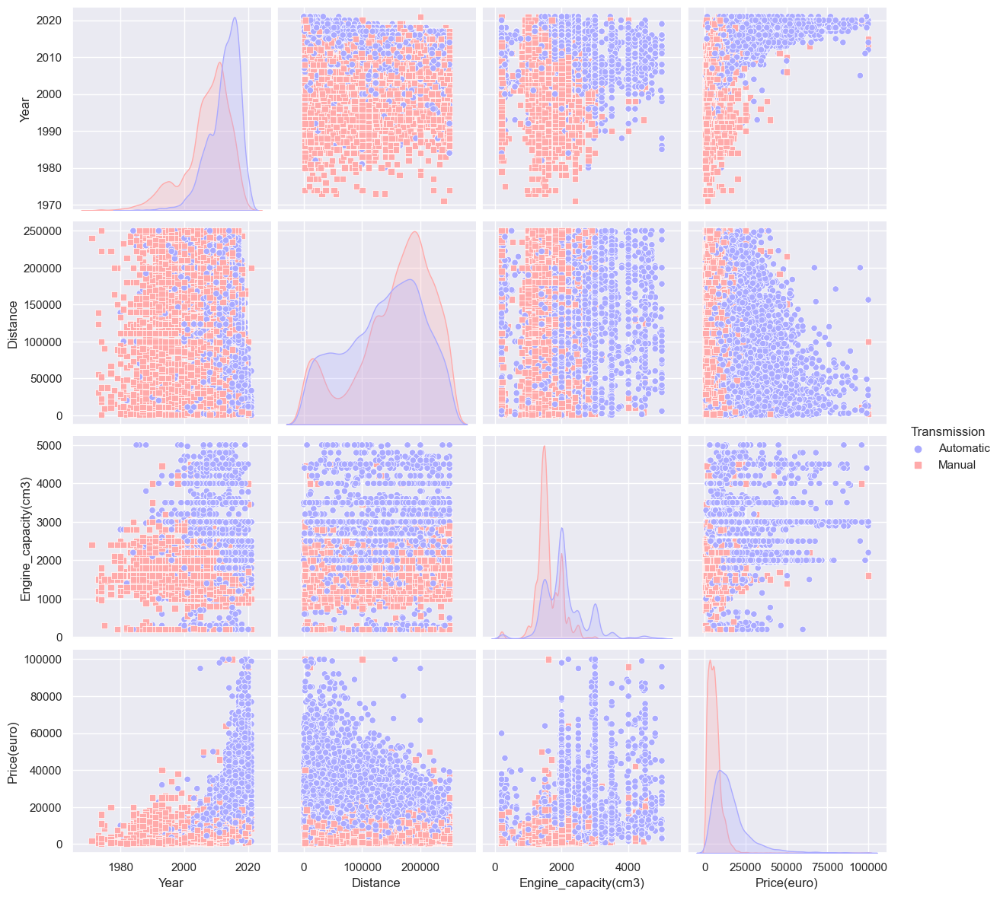

In [352]:
fig = plt.figure(figsize=(15,15))
# Устанавливаю на оттенки трасмиссии, увеличиваю отдаление до 3, настраиваю два разных маркера для удобства визуализации
sns.pairplot(data = df, hue ='Transmission', height=3, palette = 'bwr', markers=['o', 's'])

На рисунке представлено распределение в зависимости параметра от параметра на примере трансмиссии. Например, для любого параметра тип трансмиссии автомат будет дороже механики

3 новых визуализации других оттенков

<Figure size 1500x1500 with 0 Axes>

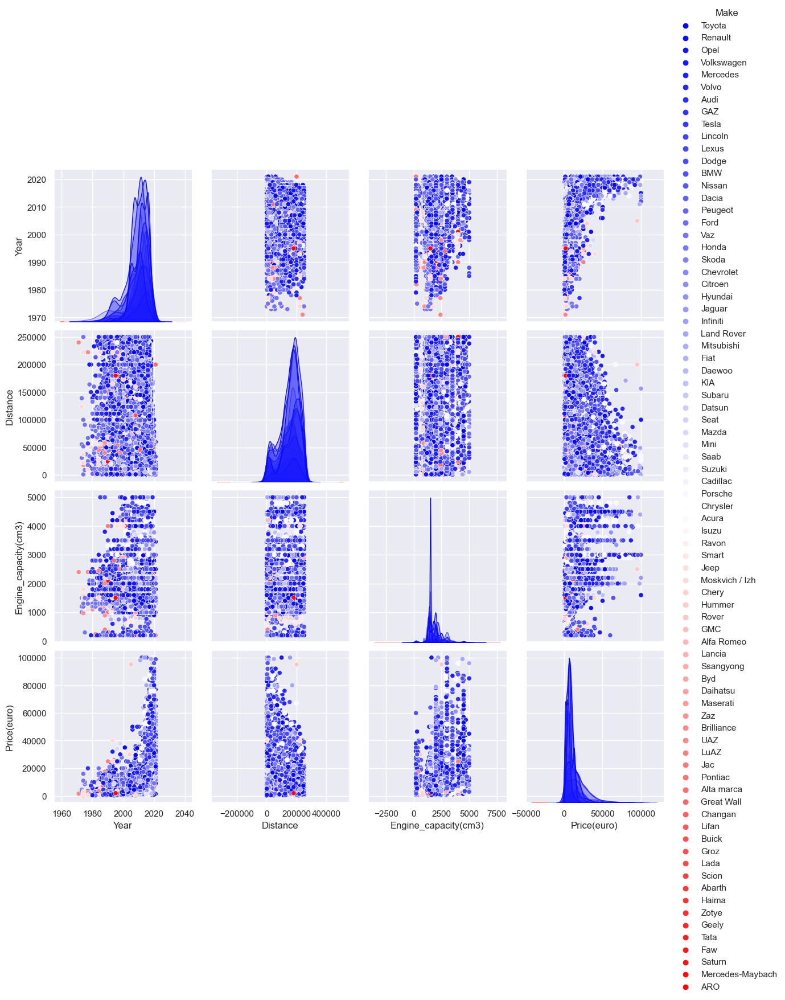

In [353]:
fig = plt.figure(figsize=(15,15))
sns.pairplot(data = df, hue ='Make', height=3, palette = 'bwr')

Зависимость параметров друг от друга на примере марки автомобиля. Здесь мы видим, что марки, обозначенные холодным цветом преобладают в количестве и по стоимости значительно выше большинства марок теплых цветов.

<Figure size 1500x1500 with 0 Axes>

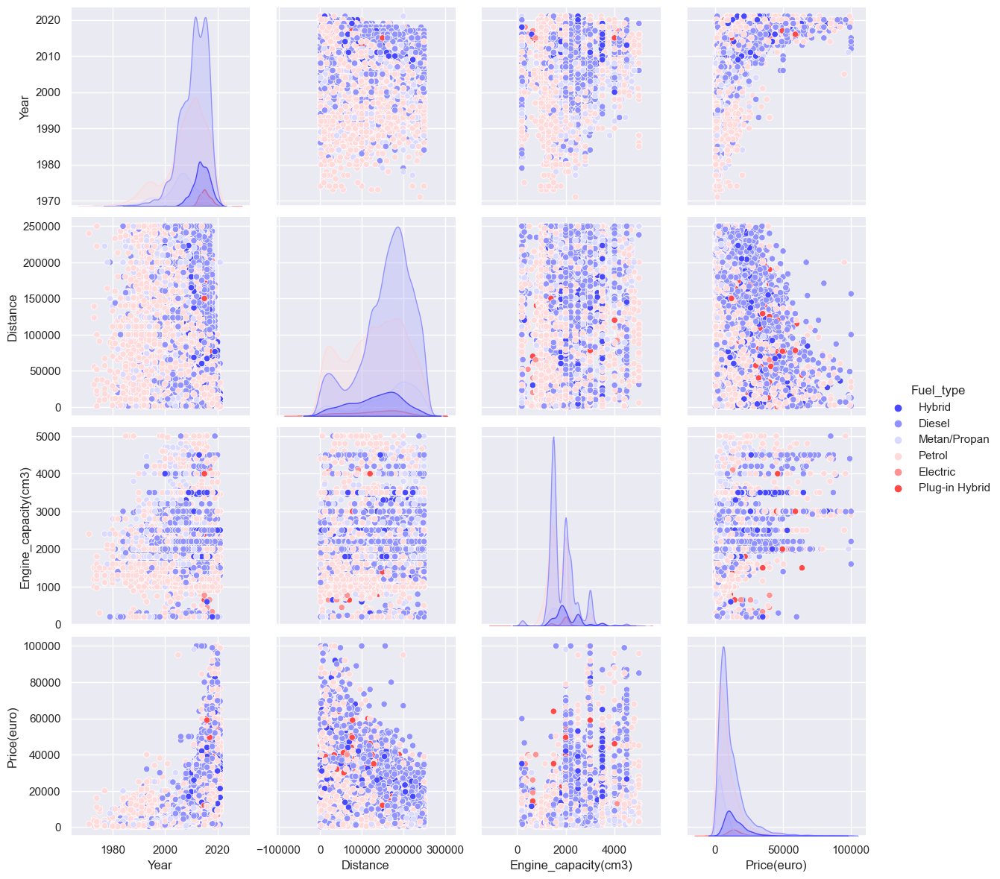

In [354]:
fig = plt.figure(figsize=(15,15))
sns.pairplot(data = df, hue ='Fuel_type', height=3, palette = 'bwr')

Зависимость параметров друг от друга на примере типа потребляемого топлива. Тут я неожиданно узнал, что автомобили ездят не только на бензине, дизеле или электричестве..

<Figure size 1500x1500 with 0 Axes>

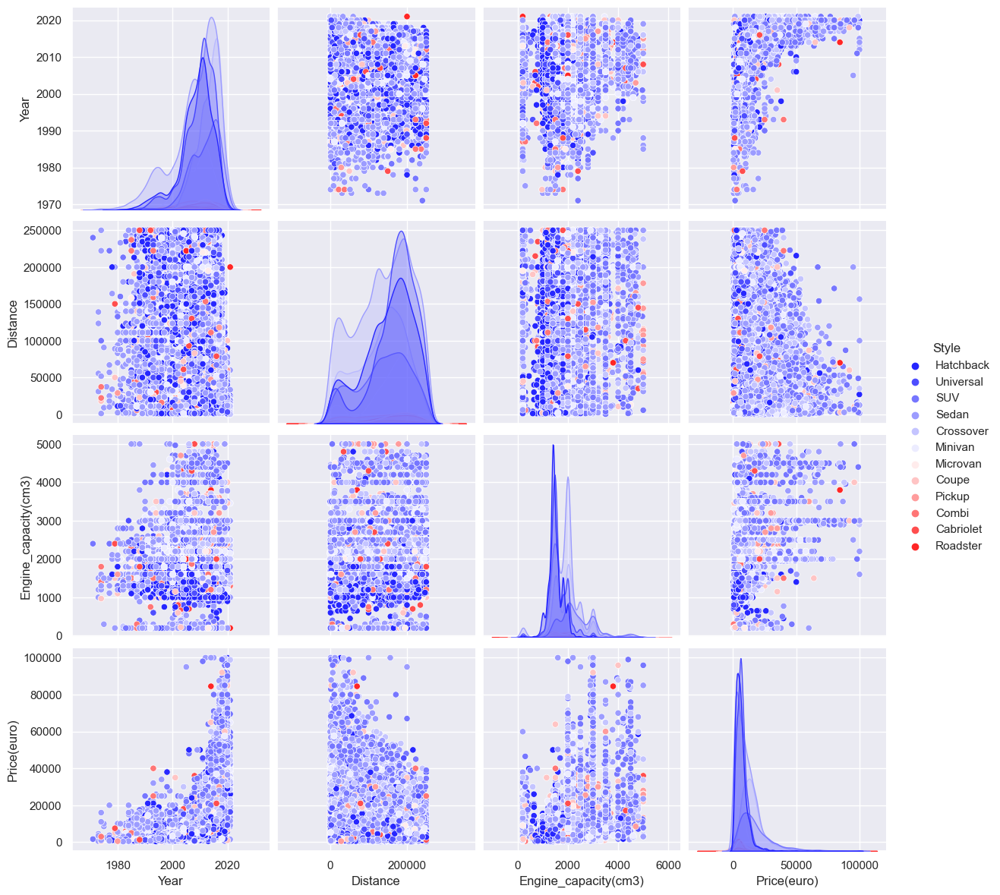

In [355]:
fig = plt.figure(figsize=(15,15))
sns.pairplot(data = df, hue ='Style', height=3, palette = 'bwr')

Зависимость параметров друг от друга на примере типа кузова автомобиля. Хетчбеки достаточно дешевые, надеюсь, что не бито и не крашено.

Задание 2. Добавление новых признаков на основе имеющихся, корреляция признаков
---

Добавляем зависимость двух признаков на гистограмму

<AxesSubplot:xlabel='km_year', ylabel='Count'>

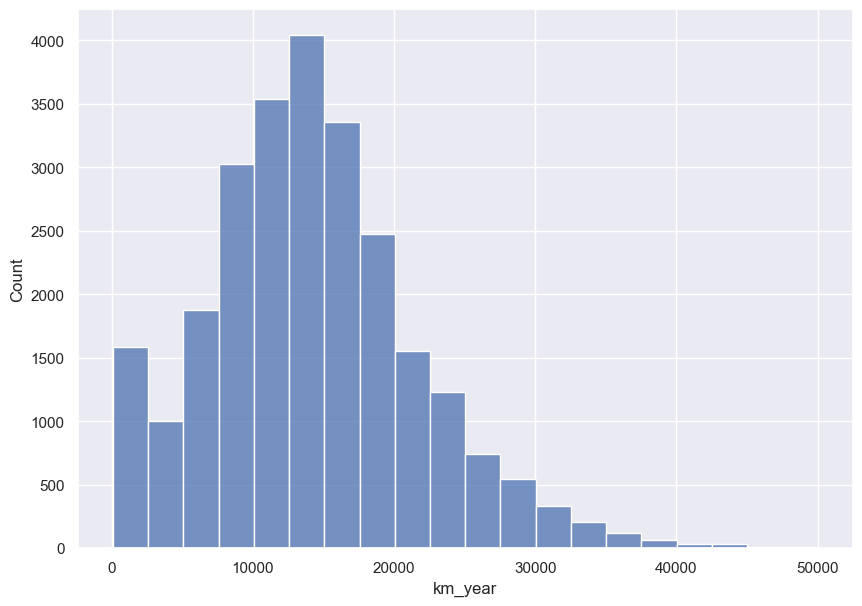

In [356]:
# Высчитываем, сколько лет автомобилю
df['Age'] = 2022 - df.Year
# Делим пробег автомобиля на количество лет, которые автомобиль прожил чтобы получить удельное число километров за год
df['km_year'] = df.Distance/df.Age
# Убираем автомобили с слишком большим и слишком маленьким пробегом
question_km_year = df[df.km_year > 50e3]
df = df.drop(question_km_year.index)
question_km_year = df[df.km_year < 100]
df = df.drop(question_km_year.index)
df = df.reset_index(drop=True)


plt.figure(figsize=(10,7))
sns.histplot(data=df, x='km_year', bins = 20)

Видим, что за год люди чаще всего проезжали около 14000 км (кстати, автомобили эконом-класса по статистике примерно столько и проезжают в год в России. Еще один (не)интересный факт - Молдавия не Россия)

<AxesSubplot:xlabel='km_year', ylabel='Year'>

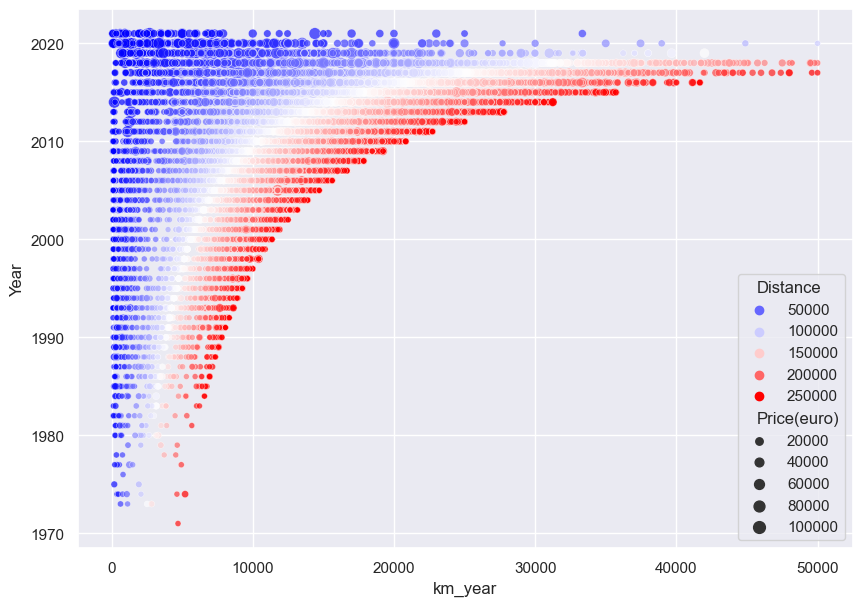

In [357]:
plt.figure(figsize=(10,7))
sns.scatterplot(    
    data=df,
    x="km_year", y="Year",
    hue="Distance", 
    size = "Price(euro)", alpha = 0.7,
             palette='bwr'
    )

Здесь можно увидеть цветовое разделение по пробегу и соответствующую цену. Можно заметить, что цены на автомобиль лучшие в среднем диапазоне пробега (100000-200000), однако автомобили 2018+ года выпуска наоборот, уменьшают цену с увеличением пробега 

In [358]:
cm = sns.color_palette("vlag", as_cmap=True)

df.corr().style.background_gradient(cmap=cm, vmin = -1, vmax=1)

,Year,Distance,Engine_capacity(cm3),Price(euro),Age,km_year
Year,1.000000,-0.215722,0.023551,0.534423,-1.000000,0.528475
Distance,-0.215722,1.000000,-0.024169,-0.312166,0.215722,0.515262
Engine_capacity(cm3),0.023551,-0.024169,1.000000,0.452738,-0.023551,-0.037180
Price(euro),0.534423,-0.312166,0.452738,1.000000,-0.534423,0.190050
Age,-1.000000,0.215722,-0.023551,-0.534423,1.000000,-0.528475
km_year,0.528475,0.515262,-0.037180,0.190050,-0.528475,1.000000


Корреляция нового признака km_year ожидаемо достаточно высока с теми, из которых он выходил, а вот корреляция между пробегом и годом выпуска обратная и небольшая.

In [359]:
# Собираю данные повторяемости марки в датафрейм и вывожу ее
counts = df.Make.value_counts()

counts

Volkswagen          2620
Toyota              2578
Renault             2039
Mercedes            1845
BMW                 1714
                    ... 
Zotye                  1
Tata                   1
Saturn                 1
Mercedes-Maybach       1
Pontiac                1
Name: Make, Length: 78, dtype: int64

In [360]:
# Закидываю в датафрейм все индексы, у которых встерчаемость марки меньше 25 раз
rare =  counts[(counts.values < 25)]
# Заменяю в датасете значения марки на "Редкая", в соответствии с ее индексом в датафрейме
df['Make'] = df['Make'].replace(rare.index.values, 'Rare')
# Настраиваю фильтр на редкие марки
DF = df[df['Make']=='Rare']
DF

,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Transmission,Price(euro),Age,km_year
13,Rare,Model S,2013,Hatchback,113000.0,367.0,Electric,Automatic,27000.0,9,12555.555556
184,Rare,on-DO,2016,Sedan,150000.0,1596.0,Metan/Propan,Manual,3200.0,6,25000.000000
305,Rare,9-3,2007,Sedan,194777.0,2000.0,Petrol,Automatic,5000.0,15,12985.133333
363,Rare,CTS,2015,Sedan,88000.0,2000.0,Petrol,Automatic,16950.0,7,12571.428571
938,Rare,RDX,2008,SUV,176000.0,2300.0,Metan/Propan,Automatic,9800.0,14,12571.428571
...,...,...,...,...,...,...,...,...,...,...,...
25433,Rare,469,1984,SUV,45000.0,2445.0,Metan/Propan,Manual,3400.0,38,1184.210526
25610,Rare,Qq,2008,Hatchback,85000.0,800.0,Metan/Propan,Manual,2100.0,14,6071.428571
25616,Rare,Hover,2008,SUV,18800.0,2400.0,Metan/Propan,Manual,5800.0,14,1342.857143
25675,Rare,Qq,2008,Universal,160000.0,800.0,Metan/Propan,Manual,650.0,14,11428.571429


Вытащил все редкие автомобили из списка автомобилей

Задание 3. Предварительная обработка данных
---

Нормализация данных

In [361]:
# Копирую основной датафрейм
DF_norm  = df.copy()
# Нахожу локальные минимумы и максимумы по оси "х" в числовых столбцах
Xmin = df[num_columns].min()
Xmax = df[num_columns].max()
# Выполняю нормализацию
DF_norm[num_columns] = (df[num_columns]- Xmin)/( Xmax - Xmin)

<AxesSubplot:xlabel='Distance', ylabel='Count'>

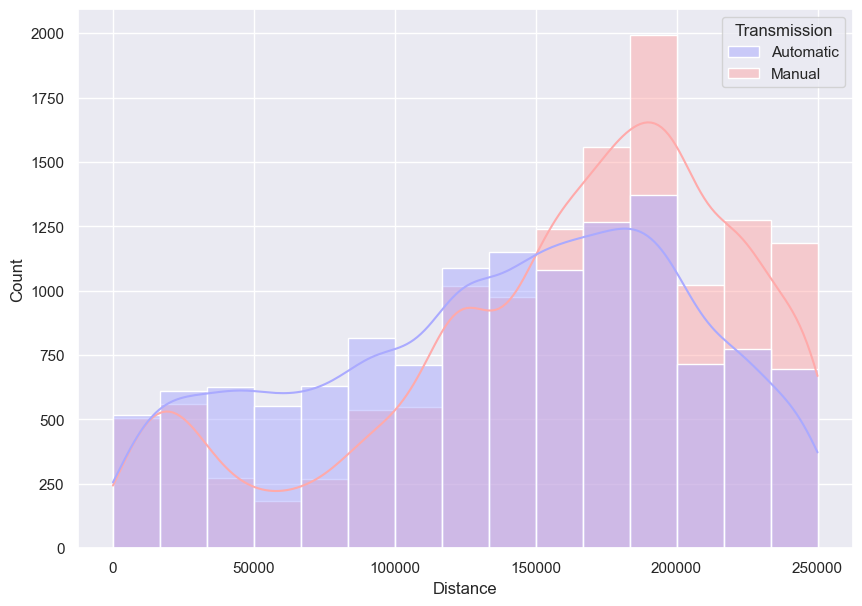

In [362]:
fig = plt.figure(figsize=(10,7))
sns.histplot(data = df,
             x = 'Distance',
             hue = 'Transmission',
             bins = 15, kde = True,
             palette='bwr')

Датафрейм до нормализации

<AxesSubplot:xlabel='Distance', ylabel='Count'>

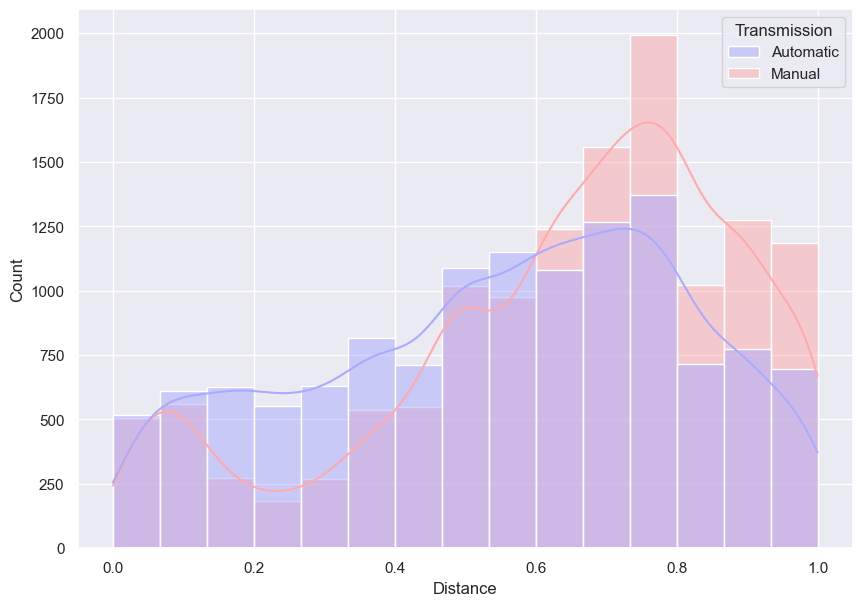

In [363]:
fig = plt.figure(figsize=(10,7))
sns.histplot(data = DF_norm,
             x = 'Distance',
             hue = 'Transmission',
             bins = 15, kde = True,
             palette='bwr')

Датафрейм после нормализации

Стандартизация данных

In [364]:
# Копирую датафрейм
DF_scaled = df.copy()
# Беру среднее значение
M = df[num_columns].mean()
# Беру стандартное отклонение от выборки по оси "х"
STD = df[num_columns].std()
# Стандартизация
DF_scaled[num_columns] = (df[num_columns]-M)/STD

<AxesSubplot:xlabel='Distance', ylabel='Count'>

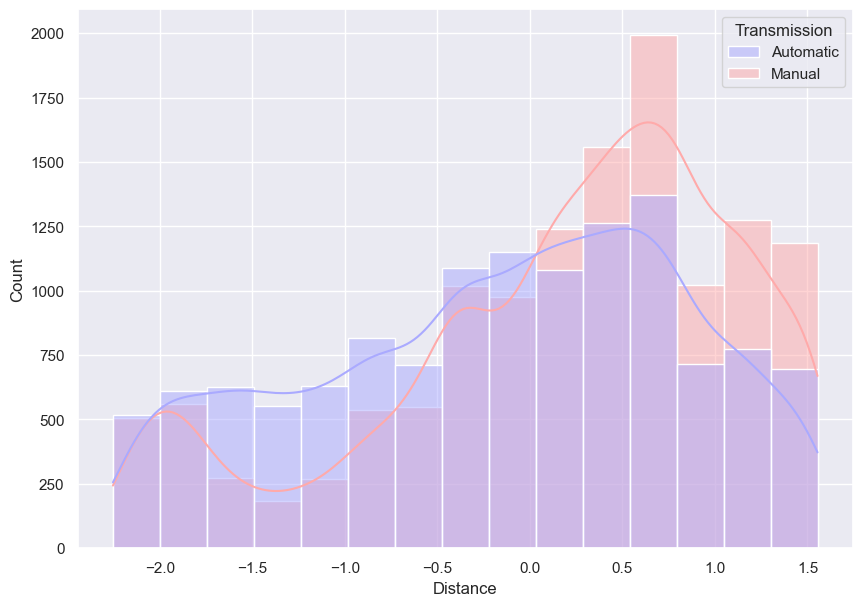

In [365]:
fig = plt.figure(figsize=(10,7))
sns.histplot(data = DF_scaled,
             x = 'Distance', 
             hue = 'Transmission',
             bins = 15, kde = True,
             palette='bwr')

Данные после стандартизации

**Нелинейное преобразование**

Сначала логарифмирование, потом стандартизация

<AxesSubplot:xlabel='Price(euro)', ylabel='Count'>

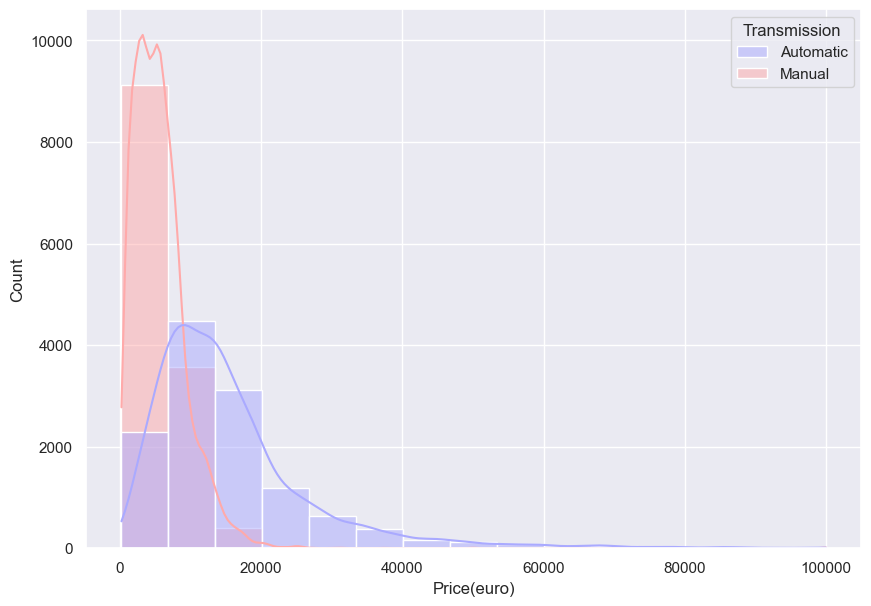

In [366]:
fig = plt.figure(figsize=(10,7))

sns.histplot(data = df,
             x = 'Price(euro)', 
             hue = 'Transmission', 
             bins = 15, kde = True,
             palette='bwr')


In [367]:
DF_power  = df.copy()
DF_power[num_columns] = np.log(DF_power[num_columns])
M = DF_power[num_columns].mean()
STD = DF_power[num_columns].std()
DF_power[num_columns] = (DF_power[num_columns]-M)/STD

<AxesSubplot:xlabel='Price(euro)', ylabel='Count'>

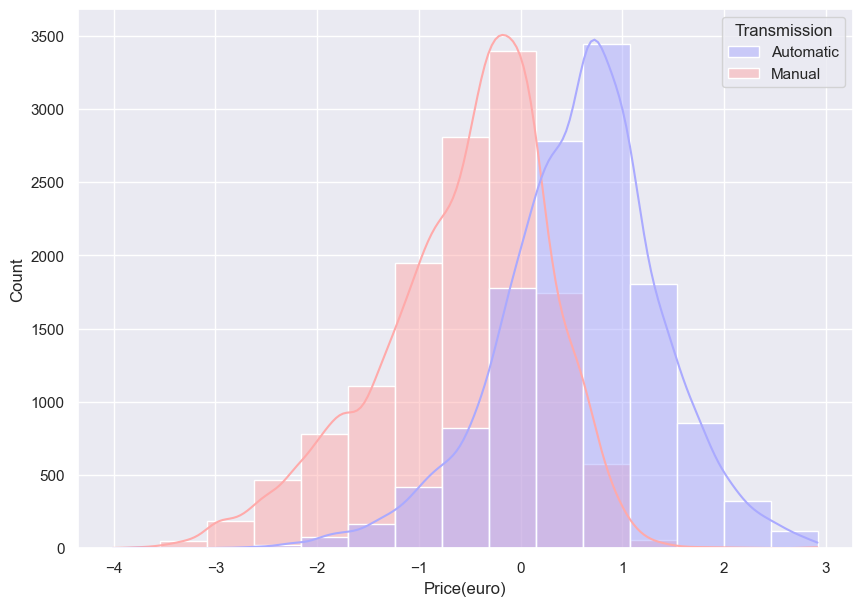

In [368]:
fig = plt.figure(figsize=(10,7))

sns.histplot(data = DF_power, 
             x = 'Price(euro)', 
             hue = 'Transmission', 
             bins = 15, kde = True,
             palette='bwr')


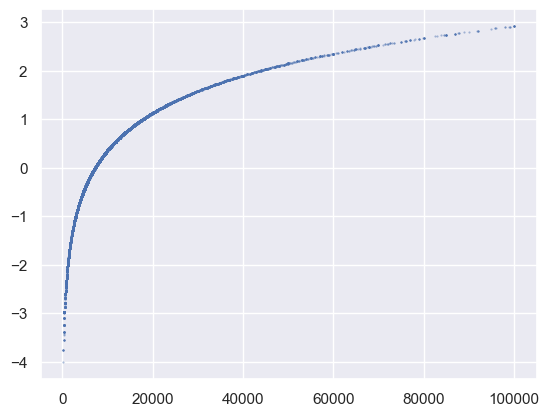

In [369]:
plt.plot(df['Price(euro)'], DF_power['Price(euro)'], '.', alpha = 0.5, markersize = 1)

# Приведение категориальных признаков к численным

### Бинарные признаки

In [370]:
df['Transmission'] = df['Transmission'].map({'Automatic': 1, 'Manual': 0})

### Кодирование многозначных признаков

In [371]:
df_se = df.copy()
df_se[cat_columns] = df_se[cat_columns].astype('category')

for _, column_name in enumerate(cat_columns):
    df_se[column_name] =  df_se[column_name].cat.codes
df_se.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25745 entries, 0 to 25744
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Make                  25745 non-null  int8   
 1   Model                 25745 non-null  int16  
 2   Year                  25745 non-null  int64  
 3   Style                 25745 non-null  int8   
 4   Distance              25745 non-null  float64
 5   Engine_capacity(cm3)  25745 non-null  float64
 6   Fuel_type             25745 non-null  int8   
 7   Transmission          25745 non-null  int8   
 8   Price(euro)           25745 non-null  float64
 9   Age                   25745 non-null  int64  
 10  km_year               25745 non-null  float64
dtypes: float64(4), int16(1), int64(2), int8(4)
memory usage: 1.3 MB


In [372]:
df_se.head()

,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Transmission,Price(euro),Age,km_year
0,39,519,2011,4,195000.0,1800.0,2,1,7750.0,11,17727.272727
1,31,351,2014,11,135000.0,1500.0,0,0,8550.0,8,16875.000000
2,31,408,2012,11,110000.0,1500.0,0,0,6550.0,10,11000.000000
3,27,129,2006,11,200000.0,1600.0,3,0,4100.0,16,12500.000000
4,41,667,2010,9,220000.0,2400.0,0,1,17000.0,12,18333.333333


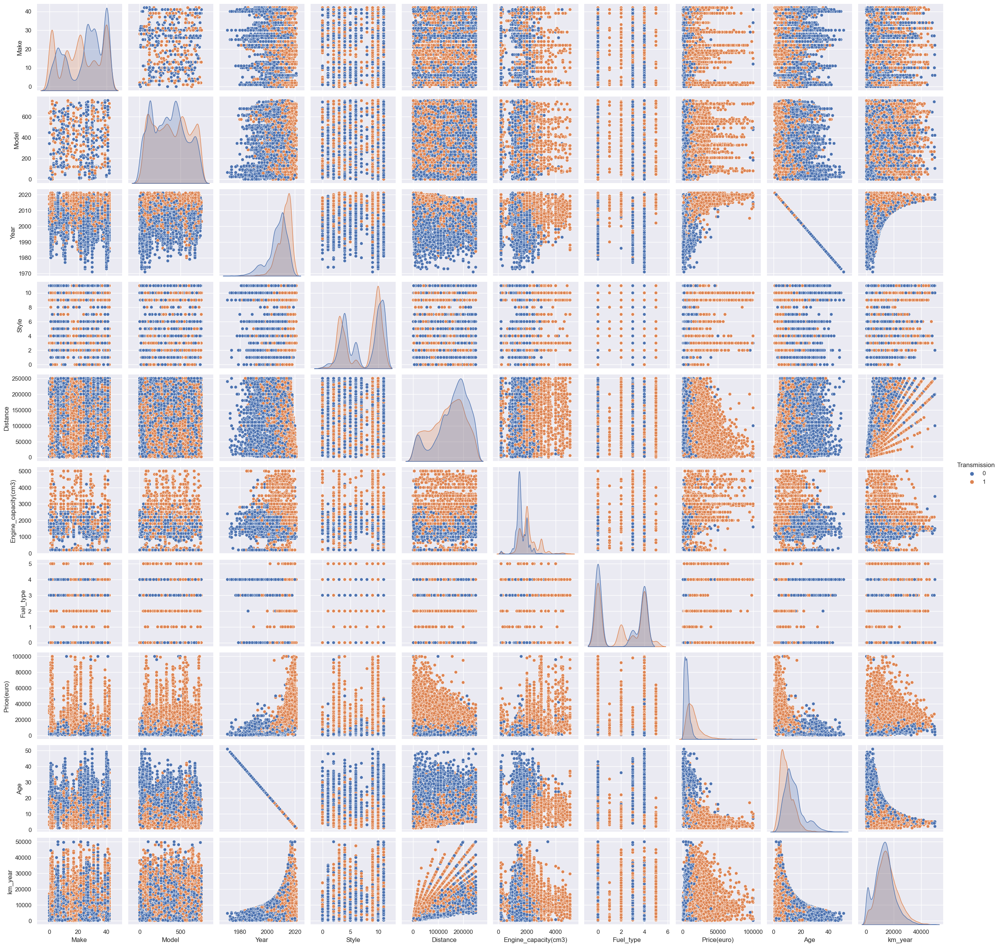

In [373]:
sns.pairplot(data = df_se, hue ='Transmission');

### One-hot кодирование многозначных признаков

In [374]:
df_ohe = df.copy()
df_ohe = pd.get_dummies(df_ohe)
df_ohe.tail()

,Year,Distance,Engine_capacity(cm3),Transmission,Price(euro),Age,km_year,Make_Alfa Romeo,Make_Audi,Make_BMW,...,Style_Roadster,Style_SUV,Style_Sedan,Style_Universal,Fuel_type_Diesel,Fuel_type_Electric,Fuel_type_Hybrid,Fuel_type_Metan/Propan,Fuel_type_Petrol,Fuel_type_Plug-in Hybrid
25740,2007,222111.0,1400.0,1,4444.0,15,14807.400000,0,0,0,...,0,0,0,0,1,0,0,0,0,0
25741,2016,78900.0,2000.0,1,21000.0,6,13150.000000,0,0,0,...,0,0,0,0,0,0,0,0,1,0
25742,2016,88000.0,1800.0,1,11500.0,6,14666.666667,0,0,0,...,0,0,1,0,0,0,0,0,1,0
25743,2002,225000.0,1800.0,0,4400.0,20,11250.000000,0,0,0,...,0,0,0,0,0,0,0,1,0,0
25744,2015,89000.0,1500.0,0,7000.0,7,12714.285714,0,0,0,...,0,0,0,1,1,0,0,0,0,0


In [375]:
df_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25745 entries, 0 to 25744
Columns: 826 entries, Year to Fuel_type_Plug-in Hybrid
dtypes: float64(4), int64(3), uint8(819)
memory usage: 21.5 MB


In [376]:
# Сохраняю нормализованные, стандартизированные датафреймы для дальнейшего использования
DF_norm.to_csv(r'D:\Study\IT-ml&ai-python\URSU\norm_cars.csv', index=False)
DF_scaled.to_csv(r'D:\Study\IT-ml&ai-python\URSU\scaled_cars.csv', index=False)
DF_power.to_csv(r'D:\Study\IT-ml&ai-python\URSU\power_cars.csv', index=False)